In [1]:
import pandas as pd
import numpy as np
import pandas_profiling as pp
import datetime as dt
import seaborn as sns
from matplotlib import pyplot as plt


In [2]:
flights_all = pd.read_csv('../data/clean_data/flights_data.csv')

'time_hour', 'dep_delay_true', 'join_id', 'wind_dir',
       'wind_speed', 'wind_gust', 'visib', 'date', 'temp_max', 'temp_min',
       'temp_ave', 'temp_departure', 'ppt', 'new_snow', 'snow_depth'

In [3]:
ewr_flights = flights_all.loc[(flights_all['origin'] == 'EWR')].copy()

In [4]:
ewr_flights_weather = ewr_flights.loc[:, ['time_hour', 'dep_delay_true', 'wind_dir',
       'wind_speed', 'wind_gust', 'visib', 'temp_max', 'temp_min',
       'temp_ave', 'temp_departure', 'ppt', 'new_snow', 'snow_depth']].copy()

In [5]:
pp.ProfileReport(ewr_flights_weather)

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


# Variable engineering

Change wind speed to Beaufort scale - categorical information on wind speed.

In [6]:
wind_labels = ['Calm', 'Light Breeze', 'Gentle Breeze', 
'Moderate Breeze', 'Fresh Breeze', 'Strong Breeze', 'Near Gale',
'Gale']

wind_bins = [0, 3, 7, 12, 18, 24, 31, 38, 46]


In [7]:
len(wind_labels)

8

In [8]:
len(wind_bins)

9

In [9]:

flights_all['wind_scale'] = pd.cut(flights_all['wind_speed'], 
bins = wind_bins, labels=wind_labels,
include_lowest = True)

In [10]:
flights_all.drop(flights_all.filter(regex="Unname"),axis=1, inplace=True)

In [11]:
flights_all.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,type,manufacturer,model,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Fixed wing multi engine,DASSAULT,FALCON 900 EX,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Fixed wing multi engine,AIRBUS,A320-232,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,Fixed wing multi engine,AIRBUS INDUSTRIE,A320-232,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Unknown,Unknown,Moderate Breeze


In [12]:
flights_all['wind_scale'].unique()

['Gentle Breeze', 'Moderate Breeze', 'Light Breeze', 'Fresh Breeze', 'Calm', 'Strong Breeze', 'Near Gale', 'Gale']
Categories (8, object): ['Calm' < 'Light Breeze' < 'Gentle Breeze' < 'Moderate Breeze' < 'Fresh Breeze' < 'Strong Breeze' < 'Near Gale' < 'Gale']

In [13]:
flights_all['wind_scale'].value_counts()

Gentle Breeze      104785
Light Breeze        85058
Moderate Breeze     75319
Fresh Breeze        14482
Calm                13505
Strong Breeze         978
Near Gale              31
Gale                    9
Name: wind_scale, dtype: int64

Check out visibility

In [14]:
flights_all['visib'].value_counts()

10.00    253398
9.00       6678
8.00       4766
4.00       4717
6.00       4549
5.00       4344
7.00       4046
3.00       3303
2.00       1959
2.50       1507
0.50        976
1.00        875
1.50        757
0.75        568
1.75        506
0.25        370
3.50        352
1.25        308
0.24        114
0.13         44
0.12         30
Name: visib, dtype: int64

Leave it as it is. Keep `wind_scale`, `visib`, `temp_ave`, `temp_departure`, `new_snow`, `snow_depth`

In [15]:
weather_drop = ['wind_dir', 'wind_gust', 'temp_max', 'temp_min', 'ppt']

flights_all_trim = flights_all.drop(columns=weather_drop)

In [16]:
flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,type,manufacturer,model,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Fixed wing multi engine,DASSAULT,FALCON 900 EX,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Fixed wing multi engine,AIRBUS,A320-232,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,Fixed wing multi engine,AIRBUS INDUSTRIE,A320-232,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Unknown,Unknown,Moderate Breeze


In [17]:
flights_all_trim.shape

(294167, 43)

Have a look at the plane info for modelling

In [18]:
pp.ProfileReport(flights_all_trim.loc[:,['manufacturer', 'type', 'carrier_name', 'engine', 'model']])

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  8.07it/s]


Remove type and model. Recode manufacturer to top 10, unknown and rest to other.

In [19]:
flights_all_trim.drop(columns=['type', 'model'], inplace = True)

In [20]:
man_keep = ['Unknown', 'BOEING', 'AIRBUS', 'AIRBUS INDUSTRIE',
 'EMBRAER', 'BOMBARDIER INC', 'MCDONNELL DOUGLAS AIRCRAFT CO', 'MCDONNELL DOUGLAS']

flights_all_trim.manufacturer = np.where(flights_all_trim.manufacturer.isin(man_keep),
flights_all_trim.manufacturer, 'Other')

flights_all_trim.head(20)

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_faa,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,IAD,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS INDUSTRIE,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze
5,1,1,533.0,540,-7.0,817.0,835,-18.0,B6,353,...,PBI,Palm Beach International Airport,26.683201,-80.095596,19.0,America/New_York,JetBlue Airways,EMBRAER,Turbo-fan,Gentle Breeze
6,1,1,527.0,530,-3.0,838.0,842,-4.0,B6,429,...,RSW,Southwest Florida International Airport,26.536200,-81.755203,30.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
7,1,1,523.0,530,-7.0,941.0,1011,-30.0,B6,939,...,NaN,NaN,NaN,NaN,NaN,NaN,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
8,1,1,519.0,520,-1.0,947.0,1000,-13.0,B6,1403,...,NaN,NaN,NaN,NaN,NaN,NaN,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
9,1,1,513.0,520,-7.0,815.0,825,-10.0,B6,901,...,FLL,Fort Lauderdale Hollywood International Airport,26.072599,-80.152702,9.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze


In [21]:
#fix man doubling for airbus and mcdonnell douglas
flights_all_trim.manufacturer = flights_all_trim.manufacturer.map({
    'AIRBUS INDUSTRIE': 'AIRBUS',
    'AIRBUS': 'AIRBUS',
    'MCDONNELL DOUGLAS': 'MCDONNELL DOUGLAS',
    'MCDONNELL DOUGLAS AIRCRAFT CO': 'MCDONNELL DOUGLAS',
    'BOEING': 'BOEING',
    'EMBRAER': 'EMBRAER', 
    'BOMBARDIER INC': 'BOMBARDIER INC',
    'Unknown': 'Unknown',
    'Other': 'Other'})

In [22]:
flights_all_trim.shape

(294167, 41)

Remove other columns not thought to be important for flight delay model:

NB - leave dest_airport!

Remove:
dest_timezone, dest_alt, dest_lon, dest_lat, dest_faa, ori_timezone, ori_lat, ori_lon, ori_airport, ori_faa, time_hour, minute, hour, dest, tailnum, flight, carrier, arr_delay, sched_arr_time, arr_time, dep_delay, sched_dep_time, dep_time, day.

Leave hour but convert to categorical add am or pm?

Add season column?

def am_pm(hour):
    if hour == 0:
        return str(12) + 'am'
    elif hour < 12:
        return str(hour) + 'am'
    else:
        return str(hour) + 'pm'

flights_all_trim['hour_flag'] = flights_all_trim.hour.map(am_pm)

flights_all_trim.head()

In [23]:
flights_all_trim['hour'] = pd.Categorical(flights_all_trim['hour'], ordered = True)

In [24]:
print(flights_all_trim['hour'].dtypes)

category


In [25]:
flights_all_trim['month_flag'] = flights_all_trim.month.astype(str)

In [26]:

flights_all_trim['month_flag'] = flights_all_trim['month_flag'].map({
    '1': 'Jan',
    '2': 'Feb',
    '3': 'Mar',
    '4': 'Apr',
    '5': 'May',
    '6': 'Jun', 
    '7': 'Jul',
    '8': 'Aug',
    '9': 'Sep',
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dec'})

In [27]:
flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale,month_flag
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze,Jan
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze,Jan


In [28]:
flights_all_trim.loc[:, 'time_hour'] = pd.to_datetime(flights_all_trim.time_hour, yearfirst=True)

flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale,month_flag
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze,Jan
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze,Jan


In [29]:
flights_all_trim['weekday'] = flights_all_trim['time_hour'].dt.day_name()

Remove:
dest_timezone, dest_alt, dest_lon, dest_lat, dest_faa, ori_timezone, ori_lat, ori_lon, ori_airport, ori_faa, time_hour, minute, hour, dest, tailnum, flight, carrier, arr_delay, sched_arr_time, arr_time, dep_delay, sched_dep_time, dep_time, day.

In [30]:
to_drop=['dest_timezone', 'ori_alt', 'dest_lon', 'dest_lat', 'dest_faa', 
'ori_timezone', 'ori_lat', 'ori_lon', 'ori_airport', 'ori_faa', 'time_hour', 
'minute', 'dest', 'tailnum', 'flight', 'carrier', 'arr_delay', 'sched_arr_time', 
'arr_time', 'dep_delay', 'month', 'sched_dep_time','dep_time', 'day']

flights_model_data = flights_all_trim.drop(columns=to_drop)

In [31]:
flights_model_data

,origin,air_time,distance,hour,dep_delay_true,wind_speed,visib,temp_ave,temp_departure,new_snow,snow_depth,dest_airport,dest_alt,carrier_name,manufacturer,engine,wind_scale,month_flag,weekday
0,JFK,135.0,944,5,True,11.50780,10.0,43.0,8.4,0.0,0.0,Orlando International Airport,96.0,JetBlue Airways,Other,Turbo-fan,Gentle Breeze,Jan,Sunday
1,EWR,136.0,937,5,False,11.50780,10.0,41.5,7.2,0.0,0.0,Orlando International Airport,96.0,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
2,EWR,45.0,212,5,False,11.50780,10.0,41.5,7.2,0.0,0.0,Washington Dulles International Airport,312.0,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
3,JFK,156.0,1089,5,True,11.50780,10.0,43.0,8.4,0.0,0.0,Miami International Airport,8.0,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan,Sunday
4,LGA,160.0,1096,5,False,12.65858,10.0,44.0,7.9,0.0,0.0,Miami International Airport,8.0,American Airlines Inc.,Unknown,Unknown,Moderate Breeze,Jan,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294162,JFK,36.0,187,22,True,11.50780,10.0,20.0,-15.0,0.6,0.0,General Edward Lawrence Logan International Ai...,20.0,JetBlue Airways,EMBRAER,Turbo-fan,Gentle Breeze,Dec,Saturday
294163,JFK,191.0,1576,23,True,12.65858,10.0,20.0,-15.0,0.6,0.0,NaN,NaN,JetBlue Airways,Other,Turbo-prop,Moderate Breeze,Dec,Saturday
294164,JFK,201.0,1617,23,True,12.65858,10.0,20.0,-15.0,0.6,0.0,NaN,NaN,JetBlue Airways,AIRBUS,Turbo-fan,Moderate Breeze,Dec,Saturday
294165,JFK,191.0,1598,23,True,12.65858,10.0,20.0,-15.0,0.6,0.0,NaN,NaN,JetBlue Airways,Other,Reciprocating,Moderate Breeze,Dec,Saturday


In [32]:
# split into EWR, and the others
ewr_model_data = flights_model_data.loc[(flights_model_data['origin'] == 'EWR')].copy()

In [33]:
ewr_model_data.drop(columns=['origin'], inplace = True)

In [34]:
ewr_model_data.shape

(112447, 18)

In [35]:
ewr_model_data.dtypes

air_time           float64
distance             int64
hour              category
dep_delay_true        bool
wind_speed         float64
visib              float64
temp_ave           float64
temp_departure     float64
new_snow           float64
snow_depth         float64
dest_airport        object
dest_alt           float64
carrier_name        object
manufacturer        object
engine              object
wind_scale        category
month_flag          object
weekday             object
dtype: object

# Ready to model EWR data

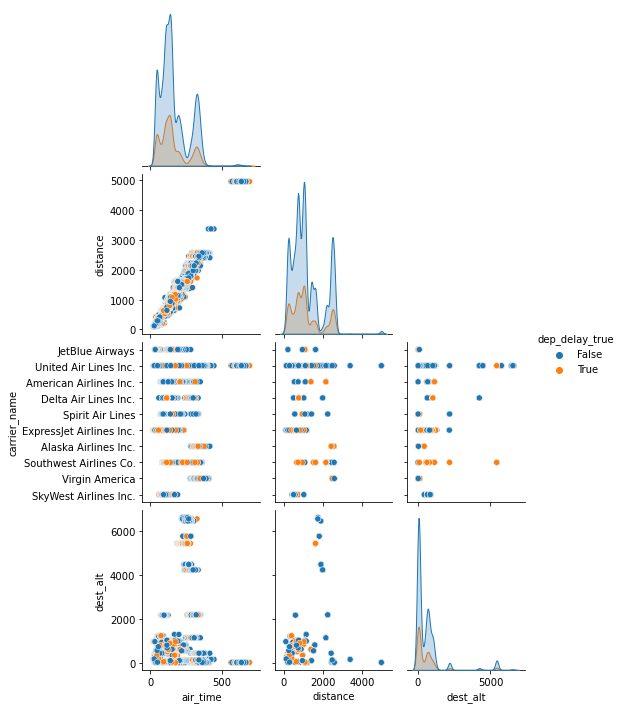

In [36]:
# check relationships between variables with seaborn pairs plot

sns.pairplot(ewr_model_data,
x_vars=['air_time', 'distance', 'dest_alt'],
y_vars=['air_time', 'distance', 'carrier_name', 'dest_alt'],
hue = 'dep_delay_true',
corner = True)

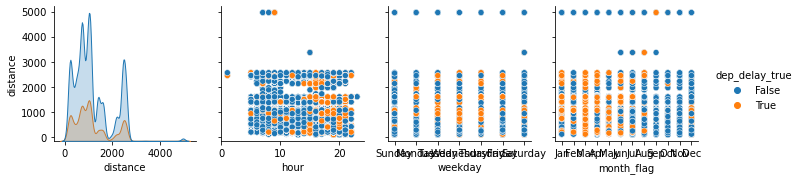

In [37]:
sns.pairplot(ewr_model_data,
x_vars=['distance', 'hour', 'weekday', 'month_flag'],
y_vars=['distance'],
hue = 'dep_delay_true')

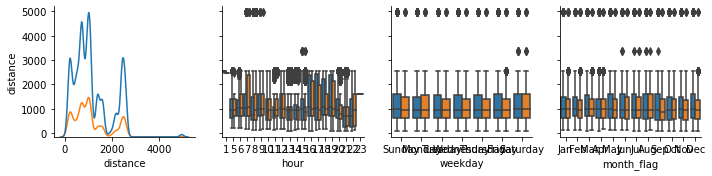

In [38]:
var_plot = sns.PairGrid(ewr_model_data, 
x_vars=['distance', 'hour', 'weekday', 'month_flag'],
y_vars=['distance'],
hue = 'dep_delay_true')

var_plot.map_diag(sns.kdeplot, color=".3")
var_plot.map_offdiag(sns.boxplot)

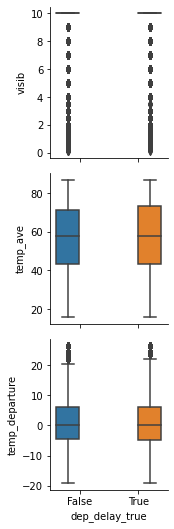

In [39]:
var_plot = sns.PairGrid(ewr_model_data, 
x_vars=['dep_delay_true'],
y_vars=['visib', 'temp_ave', 'temp_departure'],
hue = 'dep_delay_true')

var_plot.map_diag(sns.kdeplot, color=".3")
var_plot.map_offdiag(sns.boxplot)

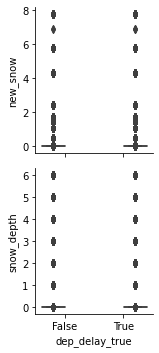

In [40]:
var_plot = sns.PairGrid(ewr_model_data, 
x_vars=['dep_delay_true'],
y_vars=['new_snow', 'snow_depth'],
hue = 'dep_delay_true')

var_plot.map_diag(sns.kdeplot, color=".3")
var_plot.map_offdiag(sns.boxplot)

In [41]:
ewr_all = flights_all_trim.loc[(flights_all_trim['origin'] == 'EWR')].copy()


In [42]:
ewr_all.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale,month_flag,weekday
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
13,1,1,559.0,600,-1.0,848.0,904,-16.0,AA,1301,...,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan,Sunday
14,1,1,557.0,600,-3.0,853.0,903,-10.0,B6,605,...,26.072599,-80.152702,9.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
20,1,1,731.0,655,36.0,830.0,808,22.0,UA,2016,...,42.364300,-71.005203,20.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday


In [43]:
def percent_delay(col):
    ewr_all.loc[:, 'dep_delay_per_'+ col] = ewr_all.groupby([col]).dep_delay_true.transform('sum')
    ewr_all.loc[:, 'total_flights_per_' + col] = ewr_all.groupby([col]).dep_delay.transform('count')
    ewr_all.loc[:, 'percent_delay_per_' + col] = (ewr_all['dep_delay_per_'+ col] / ewr_all['total_flights_per_' + col]) * 100

In [44]:
percent_delay('carrier_name')

In [45]:
carrier = ewr_all.drop_duplicates(subset=['carrier_name'])

carrier.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_timezone,carrier_name,manufacturer,engine,wind_scale,month_flag,weekday,dep_delay_per_carrier_name,total_flights_per_carrier_name,percent_delay_per_carrier_name
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday,2974,8954,33.214206
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday,12103,53896,22.456212
13,1,1,559.0,600,-1.0,848.0,904,-16.0,AA,1301,...,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan,Sunday,1330,7402,17.968117
36,1,1,611.0,615,-4.0,842.0,850,-8.0,DL,575,...,America/New_York,Delta Air Lines Inc.,MCDONNELL DOUGLAS,Turbo-fan,Gentle Breeze,Jan,Sunday,1088,5423,20.062696
38,1,1,551.0,600,-9.0,832.0,902,-30.0,NK,521,...,America/New_York,Spirit Air Lines,Unknown,Unknown,Gentle Breeze,Jan,Sunday,617,2634,23.424450


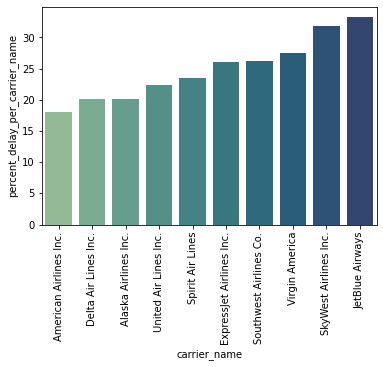

In [46]:
ordered_data = carrier.sort_values('percent_delay_per_carrier_name').carrier_name

sns.barplot(x = 'carrier_name',
y = 'percent_delay_per_carrier_name',
palette = 'crest',
order = ordered_data,
data = carrier)
plt.xticks(rotation=90);

In [47]:
percent_delay('month')

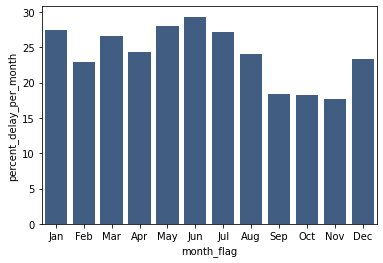

In [48]:
sns.barplot(y = 'percent_delay_per_month',
x = 'month_flag',
color = '#365c8d',
data = ewr_all);

In [49]:

ewr_delayed = ewr_all[ewr_all['dep_delay_true'] == True ]

In [50]:
ewr_delayed.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,engine,wind_scale,month_flag,weekday,dep_delay_per_carrier_name,total_flights_per_carrier_name,percent_delay_per_carrier_name,dep_delay_per_month,total_flights_per_month,percent_delay_per_month
20,1,1,731.0,655,36.0,830.0,808,22.0,UA,2016,...,Turbo-fan,Gentle Breeze,Jan,Sunday,12103,53896,22.456212,2480,9041,27.430594
30,1,1,826.0,620,126.0,1135.0,939,116.0,AA,2181,...,Unknown,Gentle Breeze,Jan,Sunday,1330,7402,17.968117,2480,9041,27.430594
31,1,1,810.0,651,79.0,1240.0,1146,54.0,UA,369,...,Turbo-fan,Gentle Breeze,Jan,Sunday,12103,53896,22.456212,2480,9041,27.430594
34,1,1,740.0,650,50.0,1106.0,1003,63.0,UA,280,...,Turbo-fan,Gentle Breeze,Jan,Sunday,12103,53896,22.456212,2480,9041,27.430594
37,1,1,834.0,615,139.0,1148.0,938,130.0,UA,1483,...,Turbo-fan,Gentle Breeze,Jan,Sunday,12103,53896,22.456212,2480,9041,27.430594


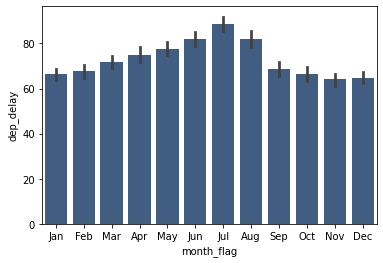

In [51]:
sns.barplot(y = 'dep_delay',
x = 'month_flag',
color = '#365c8d',
data = ewr_delayed);

<AxesSubplot:xlabel='weekday', ylabel='percent_delay_per_weekday'>

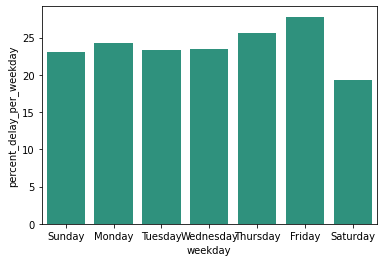

In [52]:
percent_delay('weekday')

sns.barplot(y = 'percent_delay_per_weekday',
x = 'weekday',
color = '#1fa187',
data = ewr_all)

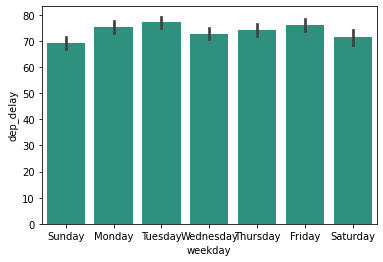

In [53]:
sns.barplot(y = 'dep_delay',
x = 'weekday',
color = '#1fa187',
data = ewr_delayed);

<AxesSubplot:xlabel='hour', ylabel='percent_delay_per_hour'>

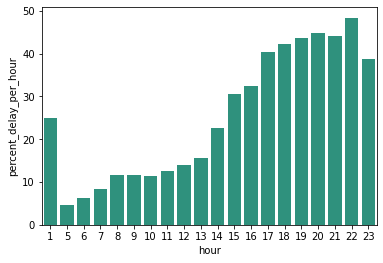

In [54]:
percent_delay('hour')

sns.barplot(y = 'percent_delay_per_hour',
x = 'hour',
color = '#1fa187',
data = ewr_all)

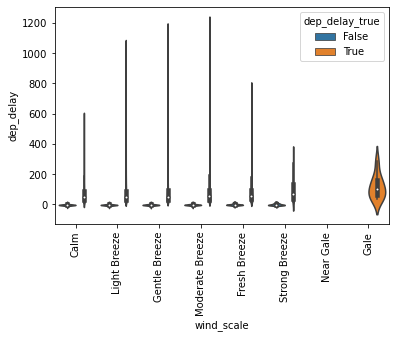

In [55]:
sns.violinplot(x = 'wind_scale',
y = 'dep_delay',
hue = 'dep_delay_true',
data = ewr_all)
plt.xticks(rotation=90);

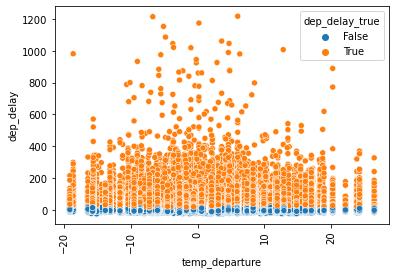

In [56]:
sns.scatterplot(x = 'temp_departure',
y = 'dep_delay',
hue = 'dep_delay_true',
data = ewr_all)
plt.xticks(rotation=90);

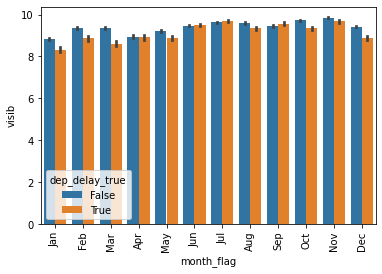

In [57]:
# look at wind speed per month - need to get the column back
# look at visib per month?
ewr_all

sns.barplot(x = 'month_flag',
y = 'visib',
hue = 'dep_delay_true',
data = ewr_all)
plt.xticks(rotation=90);

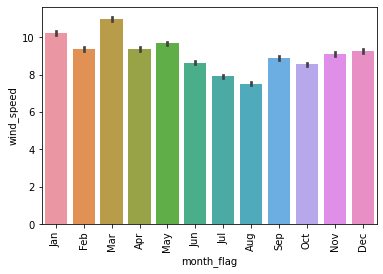

In [58]:

sns.barplot(x = 'month_flag',
y = 'wind_speed',
data = ewr_all)
plt.xticks(rotation=90);

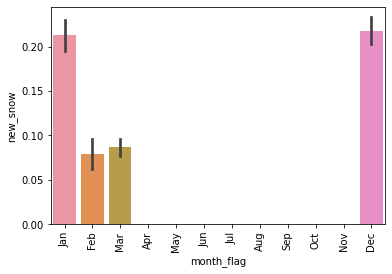

In [59]:
sns.barplot(x = 'month_flag',
y = 'new_snow',
data = ewr_all)
plt.xticks(rotation=90);

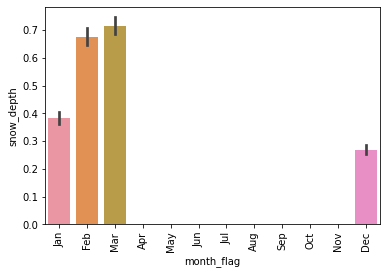

In [60]:
sns.barplot(x = 'month_flag',
y = 'snow_depth',
data = ewr_all)
plt.xticks(rotation=90);

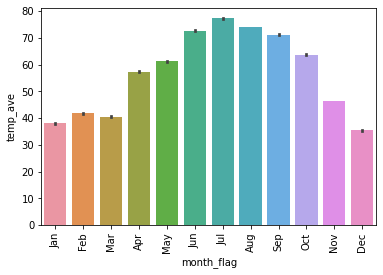

In [61]:
sns.barplot(x = 'month_flag',
y = 'temp_ave',
data = ewr_all)
plt.xticks(rotation=90);

# Geospatial plotting

In [62]:
ewr_delayed.columns

Index(['month', 'day', 'dep_time', 'sched_dep_time', 'dep_delay', 'arr_time',
       'sched_arr_time', 'arr_delay', 'carrier', 'flight', 'tailnum', 'origin',
       'dest', 'air_time', 'distance', 'hour', 'minute', 'time_hour',
       'dep_delay_true', 'wind_speed', 'visib', 'temp_ave', 'temp_departure',
       'new_snow', 'snow_depth', 'ori_faa', 'ori_airport', 'ori_lat',
       'ori_lon', 'ori_alt', 'ori_timezone', 'dest_faa', 'dest_airport',
       'dest_lat', 'dest_lon', 'dest_alt', 'dest_timezone', 'carrier_name',
       'manufacturer', 'engine', 'wind_scale', 'month_flag', 'weekday',
       'dep_delay_per_carrier_name', 'total_flights_per_carrier_name',
       'percent_delay_per_carrier_name', 'dep_delay_per_month',
       'total_flights_per_month', 'percent_delay_per_month'],
      dtype='object')

In [63]:
import folium

In [64]:
import geopandas

In [72]:
import cartopy

    m=Basemap(llcrnrlon=-179, llcrnrlat=-60, urcrnrlon=179, urcrnrlat=70,  projection='merc')
    m.drawmapboundary(fill_color='white', linewidth=0)
    m.fillcontinents(color='#f2f2f2', alpha=0.7)
    m.drawcoastlines(linewidth=0.1, color="white")

In [80]:
cartopy.config['data_dir']

'/Users/annebraae/.local/share/cartopy'

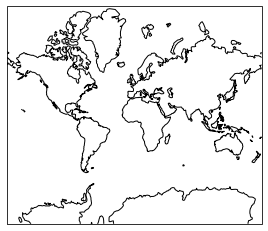

In [81]:
import cartopy.crs as ccrs
plt.figure()
ax = plt.axes(projection=ccrs.Mercator())
ax.coastlines()



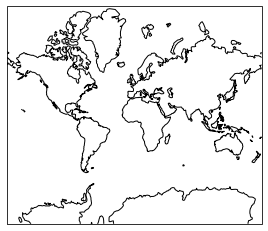

In [86]:
lons = np.array([-179, 179])
lats = np.array([-60, 70])
width = 4
height = 4

projected_corners = ccrs.Mercator().transform_points(ccrs.PlateCarree(), lons, lats)
xs = np.linspace(projected_corners[0, 0], projected_corners[1, 0], width)
ys = np.linspace(projected_corners[0, 1], projected_corners[1, 1], height)
x2d, y2d = np.meshgrid(xs, ys)
ax = plt.axes(projection=ccrs.Mercator())
ax.coastlines()

plt.show();

In [122]:
# plot setting for notebook

plt.rcParams['figure.figsize'] = [5, 3]
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10

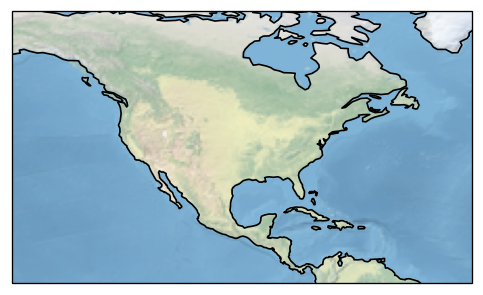

In [126]:

extent = [-150, -40, 5, 70]
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent(extent, crs=ccrs.PlateCarree())
ax.stock_img()
ax.coastlines()

# Random forest model building

### Variable engineering - making dummy variables

In [144]:
ewr_model_data.head()

,air_time,distance,hour,dep_delay_true,wind_speed,visib,temp_ave,temp_departure,new_snow,snow_depth,dest_airport,dest_alt,carrier_name,manufacturer,engine,wind_scale,month_flag,weekday
1,136.0,937,5,False,11.5078,10.0,41.5,7.2,0.0,0.0,Orlando International Airport,96.0,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
2,45.0,212,5,False,11.5078,10.0,41.5,7.2,0.0,0.0,Washington Dulles International Airport,312.0,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
13,154.0,1085,6,False,10.9300,10.0,41.5,7.2,0.0,0.0,Miami International Airport,8.0,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan,Sunday
14,153.0,1065,6,False,10.9300,10.0,41.5,7.2,0.0,0.0,Fort Lauderdale Hollywood International Airport,9.0,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
20,42.0,200,6,True,10.9300,10.0,41.5,7.2,0.0,0.0,General Edward Lawrence Logan International Ai...,20.0,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday


In [132]:
ewr_dummies = pd.get_dummies(ewr_model_data, drop_first=True)

In [133]:
ewr_dummies.head()

,air_time,distance,dep_delay_true,wind_speed,visib,temp_ave,temp_departure,new_snow,snow_depth,dest_alt,...,month_flag_May,month_flag_Nov,month_flag_Oct,month_flag_Sep,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
1,136.0,937,False,11.5078,10.0,41.5,7.2,0.0,0.0,96.0,...,0,0,0,0,0,0,1,0,0,0
2,45.0,212,False,11.5078,10.0,41.5,7.2,0.0,0.0,312.0,...,0,0,0,0,0,0,1,0,0,0
13,154.0,1085,False,10.9300,10.0,41.5,7.2,0.0,0.0,8.0,...,0,0,0,0,0,0,1,0,0,0
14,153.0,1065,False,10.9300,10.0,41.5,7.2,0.0,0.0,9.0,...,0,0,0,0,0,0,1,0,0,0
20,42.0,200,True,10.9300,10.0,41.5,7.2,0.0,0.0,20.0,...,0,0,0,0,0,0,1,0,0,0


In [146]:
ewr_dummies.shape

(112447, 163)

In [142]:
# include destination airport and altitude - need to remove NaNs from this column
# drop these NaNs for this initial round.

ewr_dummies.dropna()

,air_time,distance,dep_delay_true,wind_speed,visib,temp_ave,temp_departure,new_snow,snow_depth,dest_alt,...,month_flag_May,month_flag_Nov,month_flag_Oct,month_flag_Sep,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
1,136.0,937,False,11.50780,10.0,41.5,7.2,0.0,0.0,96.0,...,0,0,0,0,0,0,1,0,0,0
2,45.0,212,False,11.50780,10.0,41.5,7.2,0.0,0.0,312.0,...,0,0,0,0,0,0,1,0,0,0
13,154.0,1085,False,10.93000,10.0,41.5,7.2,0.0,0.0,8.0,...,0,0,0,0,0,0,1,0,0,0
14,153.0,1065,False,10.93000,10.0,41.5,7.2,0.0,0.0,9.0,...,0,0,0,0,0,0,1,0,0,0
20,42.0,200,True,10.93000,10.0,41.5,7.2,0.0,0.0,20.0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294147,341.0,2454,False,10.35702,10.0,19.0,-15.7,0.5,0.0,125.0,...,0,0,0,0,0,1,0,0,0,0
294148,51.0,284,False,10.35702,10.0,19.0,-15.7,0.5,0.0,26.0,...,0,0,0,0,0,1,0,0,0,0
294149,144.0,1085,False,10.35702,10.0,19.0,-15.7,0.5,0.0,8.0,...,0,0,0,0,0,1,0,0,0,0
294154,153.0,1068,True,6.90468,10.0,19.0,-15.7,0.5,0.0,30.0,...,0,0,0,0,0,1,0,0,0,0


In [158]:
ewr_dummies.isnull().sum()

air_time             0
distance             0
dep_delay_true       0
wind_speed           0
visib                0
                    ..
weekday_Saturday     0
weekday_Sunday       0
weekday_Thursday     0
weekday_Tuesday      0
weekday_Wednesday    0
Length: 163, dtype: int64

In [184]:
# split into predictors and response
ewr_predictors = ewr_dummies.drop(columns = 'dep_delay_true')
ewr_response = ewr_dummies['dep_delay_true']

In [185]:
ewr_predictors.isna().sum()

air_time             0
distance             0
wind_speed           0
visib                0
temp_ave             0
                    ..
weekday_Saturday     0
weekday_Sunday       0
weekday_Thursday     0
weekday_Tuesday      0
weekday_Wednesday    0
Length: 162, dtype: int64

In [186]:
# although not interested in making predictions, 
# still split into test train so can determine model performance

from sklearn.model_selection import train_test_split

In [187]:
ewr_pred_names = list(ewr_predictors)

In [195]:
ewr_predictors = np.nan_to_num(ewr_predictors.astype(np.float32))

In [196]:
#test train split of 20%

ewr_pred_train, ewr_pred_test, ewr_resp_train, ewr_resp_test = \
    train_test_split(ewr_predictors, ewr_response, test_size = 0.2)

# test proportions of test and train?
https://towardsdatascience.com/3-things-you-need-to-know-before-you-train-test-split-869dfabb7e50
def get_proportions(df):
    class_counts = get_class_counts(df)
    return {val[0]: round(val[1]/df.shape[])}

ewr_resp_test_proportions = get_class_proportions(ewr_resp_test)


In [197]:
from sklearn.ensemble import RandomForestClassifier

ewr_model = RandomForestClassifier(n_estimators = 10,
                                    random_state = 42)

ewr_model.fit(ewr_pred_train, ewr_resp_train)

RandomForestClassifier(n_estimators=10, random_state=42)

In [207]:
ewr_model.score(ewr_pred_train, ewr_resp_train)

0.9804239803461654

In [198]:
ewr_model.score(ewr_pred_test, ewr_resp_test)

0.782792352156514

In [199]:
from sklearn.tree import plot_tree

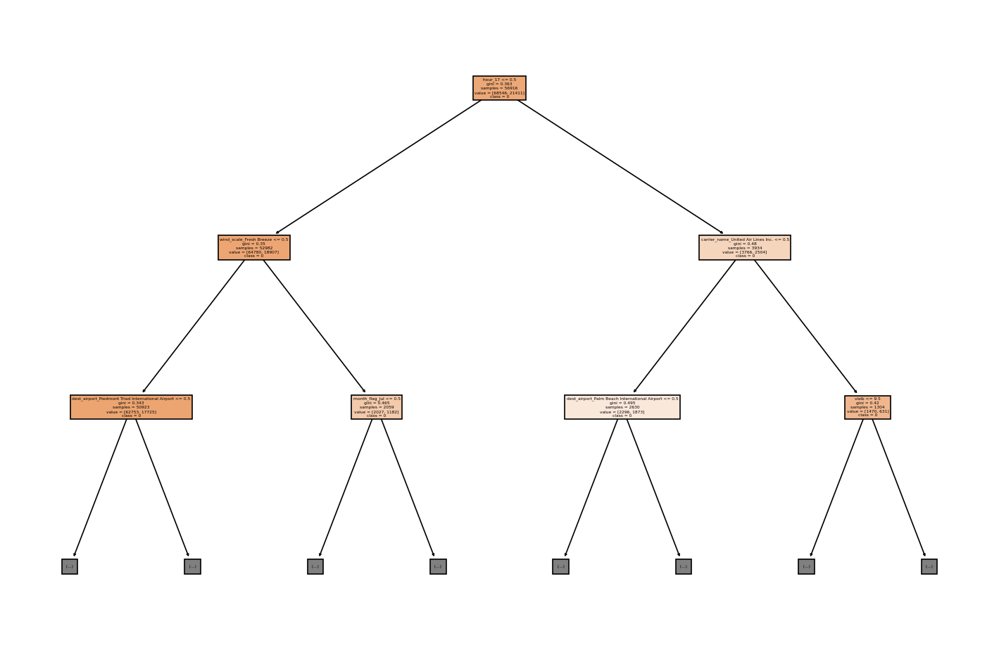

In [200]:
# list of predictors, array with target
ewr_resp_names = ['0', '1']

# plot size
fig = plt.figure(figsize = (15, 10))

# plot the decision tree

plot_tree(ewr_model.estimators_[0],
            max_depth = 2,
            feature_names = ewr_pred_names,
            class_names = ewr_resp_names,
            filled = True);

In [201]:
# Get numerical feature importances
importances = list(ewr_model.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(ewr_pred_names, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: air_time             Importance: 0.12
Variable: temp_ave             Importance: 0.09
Variable: temp_departure       Importance: 0.09
Variable: wind_speed           Importance: 0.07
Variable: distance             Importance: 0.05
Variable: dest_alt             Importance: 0.05
Variable: visib                Importance: 0.03
Variable: new_snow             Importance: 0.01
Variable: snow_depth           Importance: 0.01
Variable: hour_6               Importance: 0.01
Variable: hour_7               Importance: 0.01
Variable: hour_8               Importance: 0.01
Variable: hour_9               Importance: 0.01
Variable: hour_10              Importance: 0.01
Variable: hour_11              Importance: 0.01
Variable: hour_12              Importance: 0.01
Variable: hour_13              Importance: 0.01
Variable: hour_14              Importance: 0.01
Variable: hour_15              Importance: 0.01
Variable: hour_16              Importance: 0.01
Variable: hour_17              Importanc

In [202]:
from sklearn.tree import export_text

print(export_text(ewr_model.estimators_[0], 
                  spacing=3, decimals=3,
                  feature_names=ewr_pred_names))

|--- hour_17 <= 0.500
|   |--- wind_scale_Fresh Breeze <= 0.500
|   |   |--- dest_airport_Piedmont Triad International Airport <= 0.500
|   |   |   |--- wind_scale_Moderate Breeze <= 0.500
|   |   |   |   |--- hour_19 <= 0.500
|   |   |   |   |   |--- hour_9 <= 0.500
|   |   |   |   |   |   |--- hour_21 <= 0.500
|   |   |   |   |   |   |   |--- hour_16 <= 0.500
|   |   |   |   |   |   |   |   |--- hour_7 <= 0.500
|   |   |   |   |   |   |   |   |   |--- month_flag_Nov <= 0.500
|   |   |   |   |   |   |   |   |   |   |--- hour_6 <= 0.500
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 53
|   |   |   |   |   |   |   |   |   |   |--- hour_6 >  0.500
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 39
|   |   |   |   |   |   |   |   |   |--- month_flag_Nov >  0.500
|   |   |   |   |   |   |   |   |   |   |--- hour_8 <= 0.500
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 39
|   |   |   |   |   |   |   |   |   

In [204]:
ewr_resp_pred = ewr_model.predict(ewr_pred_test)

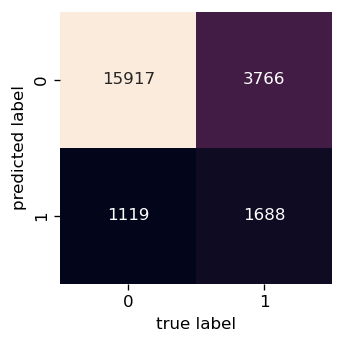

In [206]:
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(ewr_resp_test, ewr_resp_pred)
sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False)
plt.xlabel('true label')
plt.ylabel('predicted label');

So the model is currently better at predicting flights which do not get delayed rather than flights which do get delayed.

Repeating the code - min_samples_leaf = 5 or 10 to minimize overfitting.

In [209]:
ewr_resp_test

14558     False
227092     True
88642     False
72076     False
179645    False
          ...  
255376    False
3216       True
166613    False
163455    False
185113    False
Name: dep_delay_true, Length: 22490, dtype: bool

In [210]:
ewr_pred_test

array([[1.920000e+02, 1.608000e+03, 0.000000e+00, ..., 0.000000e+00,
        0.000000e+00, 0.000000e+00],
       [1.250000e+02, 9.370000e+02, 1.193000e+01, ..., 0.000000e+00,
        0.000000e+00, 0.000000e+00],
       [1.650000e+02, 1.085000e+03, 1.380936e+01, ..., 0.000000e+00,
        0.000000e+00, 0.000000e+00],
       ...,
       [1.180000e+02, 9.370000e+02, 1.150780e+01, ..., 0.000000e+00,
        0.000000e+00, 1.000000e+00],
       [9.700000e+01, 6.280000e+02, 0.000000e+00, ..., 0.000000e+00,
        0.000000e+00, 0.000000e+00],
       [1.250000e+02, 7.190000e+02, 8.060000e+00, ..., 1.000000e+00,
        0.000000e+00, 0.000000e+00]], dtype=float32)

In [227]:
# permutation importance
from sklearn.inspection import permutation_importance

result = permutation_importance(ewr_model, ewr_pred_test, ewr_resp_test, n_repeats=10,
random_state=42, n_jobs=2)

In [228]:
sorted_idx = result.importances_mean.argsort()

In [225]:
perm_results = result.importances[sorted_idx].T

In [226]:
perm_results.shape

(10, 162)

In [231]:
perm_results.head()

AttributeError: 'numpy.ndarray' object has no attribute 'head'

/Users/annebraae/opt/anaconda3/envs/python3-7_proj/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  """


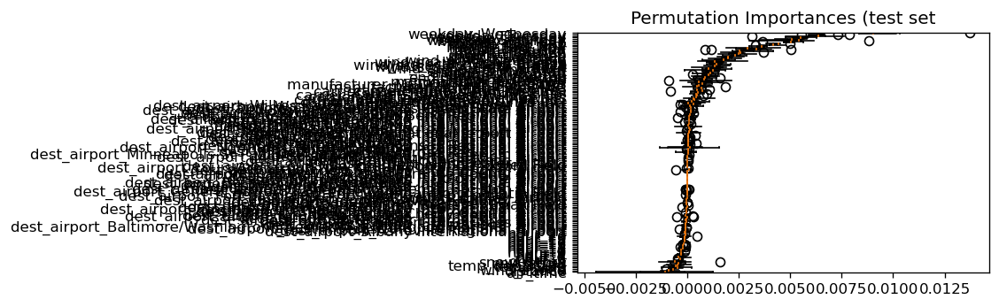

In [229]:

fig, ax = plt.subplots()
ax.boxplot(perm_results, 
vert=False, labels= ewr_pred_names)
ax.set_title("Permutation Importances (test set")
fig.tight_layout()
plt.show();